In [1]:
import os
import numpy as np 
from copy import deepcopy 

from astropy.io import fits  
from astropy.table import Table
from astropy.nddata import CCDData, Cutout2D
from astropy.wcs import WCS
from astropy.stats import sigma_clipped_stats, sigma_clip
from astropy import units as u 

from petrofit.fitting import fit_background
from petrofit.segmentation import plot_segment_residual, make_catalog, plot_segments
from petrofit.photometry import order_cat 

In [2]:
%matplotlib inline

from matplotlib import pyplot as plt

plt.rcParams['figure.figsize'] = [10, 10]
plt.rcParams['image.origin'] = 'lower'
#plt.rcParams.update({'font.size': 17})

SMALL_SIZE = 15
MEDIUM_SIZE = 18
BIGGER_SIZE = 20

#plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=BIGGER_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=BIGGER_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

def savefig(filename):
    plt.savefig("plots/"+filename, dpi=70, bbox_inches = 'tight', pad_inches = 0.1)

In [3]:
import ipywidgets as widgets
from IPython.display import display

DISPLAY_STYLE = {'description_width': 'initial'}

In [4]:
from astroquery.skyview import SkyView

In [5]:
#fits_file = SkyView.get_image_list(position='Eta Carinae', survey=['SDSSg'])[0]

In [6]:
#data = fits.getdata(fits_file)

In [7]:
# images = SkyView.get_images(position='12h18m57.5s +47d18m14s', coordinates='icrs', survey=['SDSSg'], radius=20*u.arcmin, pixels=1000)

In [8]:

# images = SkyView.get_images(position='12h19m50.6s +29d36m52s', coordinates='icrs', survey=['SDSSg'], radius=20*u.arcmin, pixels=1000)

In [9]:


# images = SkyView.get_images(position='12h34m20.3s +08d11m52s', coordinates='icrs', survey=['SDSSg'], radius=20*u.arcmin, pixels=1000)

In [10]:

# images = SkyView.get_images(position='12h35m26.453s +14d29m46.82s', coordinates='icrs', survey=['SDSSg'], radius=20*u.arcmin, pixels=1000)

In [11]:
images = {}
filter_list = ['SDSS{}'.format(f) for f in  ['g', 'r', 'i', 'z']]
sky_position='12h35m26.453s +14d29m46.82s'
for filter_name in filter_list:
    print(filter_name)
    skyview_hdul = SkyView.get_images(
        position=sky_position, 
        coordinates='icrs', 
        survey=[filter_name], 
        radius=20*u.arcmin,
        pixels=1000
    )
    
    images[filter_name] = CCDData(skyview_hdul[0][0].data, header=skyview_hdul[0][0].header, unit='electron / s ')

SDSSg


SDSSr
SDSSi
SDSSz


SDSSg


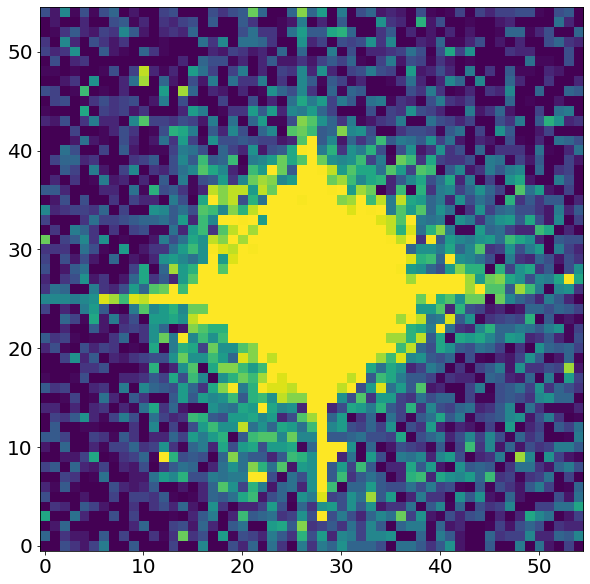

SDSSr


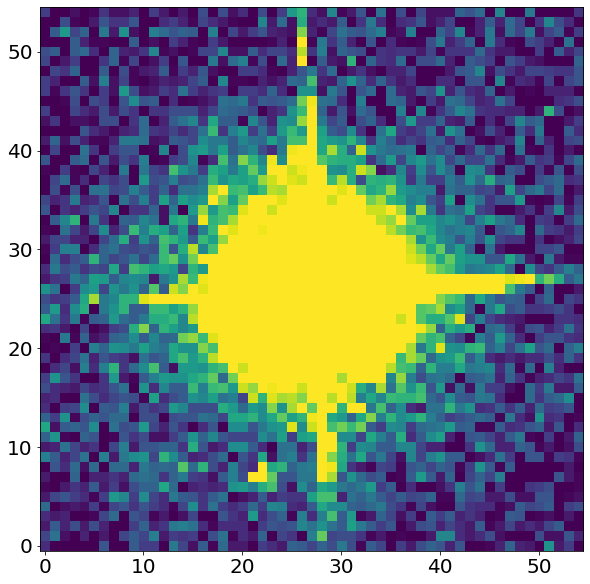

SDSSi


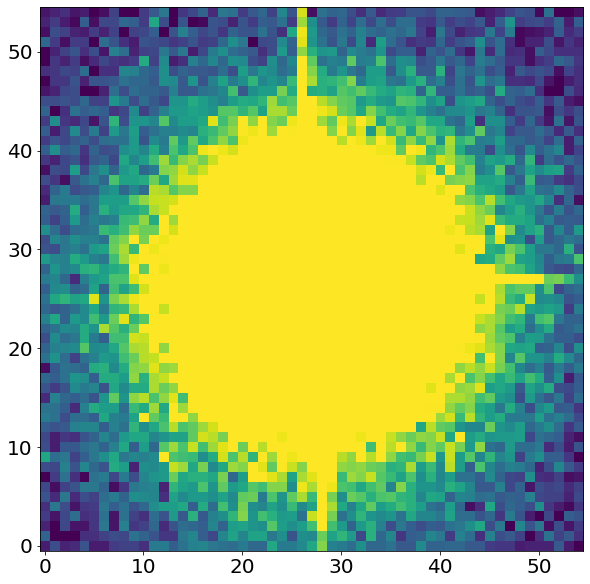

SDSSz


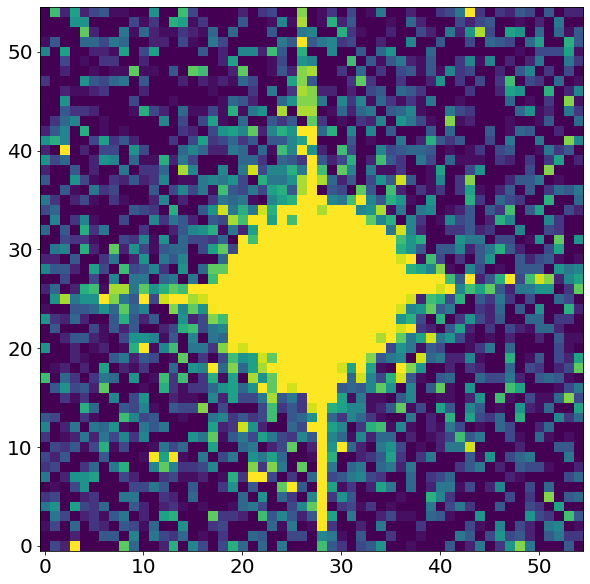

In [12]:
psf_set = {}

for f in filter_list:
    print(f)
    im = images[f]
    psf_pos = (848, 497)
    psf_cutout_size = 55
    psf = Cutout2D(im, psf_pos, psf_cutout_size, copy=True)
    psf = psf.data

    # Fit and remove bg plane
    psf_bg, _ = fit_background(psf, sigma=1/10)
    y_arange, x_arange = np.mgrid[0:psf.shape[0], 0:psf.shape[0]]
    psf -= psf_bg(x_arange, y_arange)

    psf = psf /  psf.sum()
    
    psf_set[f] = psf

    vmaxpsf=np.nanmean(psf)/2
    plt.imshow(psf, vmax=vmaxpsf,  vmin=0)
    plt.show()

In [13]:
main_filter = 'SDSSi'
im = images[main_filter].copy()
psf = psf_set[main_filter]

In [14]:
im_mean, _, im_std = sigma_clipped_stats(im, sigma=3)


In [15]:
vmax=im_mean+im_std*8
vmin=-vmax

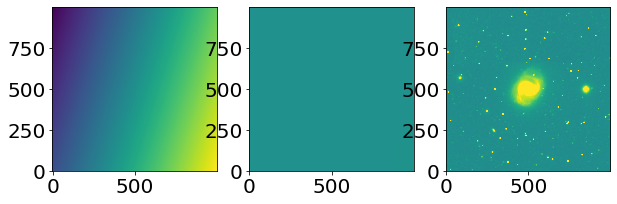

In [16]:

def calc_bg(target_image):
    fig, axs = plt.subplots(1,3)
    x_arr = np.linspace(0, target_cutout_size, target_cutout_size+1)[:-1]
    x_grid, y_grid = np.meshgrid(x_arr, x_arr)
    
    bg_image = fit_background(target_image)[0](x_grid, y_grid)
    
    plt.sca(axs[0])
    plt.imshow(bg_image)
    
    plt.sca(axs[1])
    plt.imshow(bg_image, vmax=vmax, vmin=vmin)
    
    plt.sca(axs[2])
    plt.imshow(target_image-bg_image, vmax=vmax, vmin=vmin)
    
    return bg_image

target_cutout_size = len(im.data)
bg = calc_bg(im)
im = im - bg 

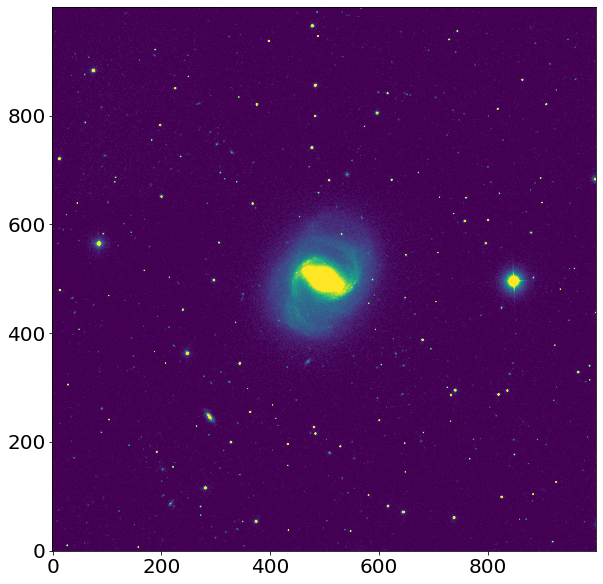

In [17]:
plt.imshow(im, vmax=im_mean+im_std*20, vmin=im_mean)

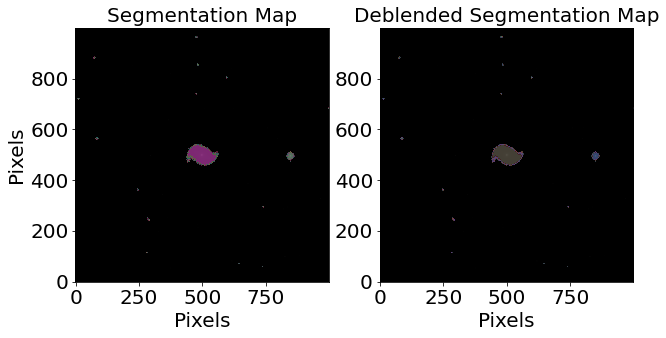

Num of Targets: 17


In [18]:
threshold = im_std * 10 #data_stats[base_filter][-1]*10

# Define smoothing kernel
kernel_size = None
fwhm = 3

# Min Source size (area)
npixels = 4**2


cat, segm, segm_deblend = make_catalog(    
    im, 
    threshold=threshold, 
    deblend=True,                 
    kernel_size=kernel_size,                  
    fwhm=fwhm, 
    npixels=npixels,
    contrast=0.90,
    plot=True, #vmax=vmax, vmin=vmin
    
)

plt.show()

# Display source properties
print("Num of Targets:", len(cat))

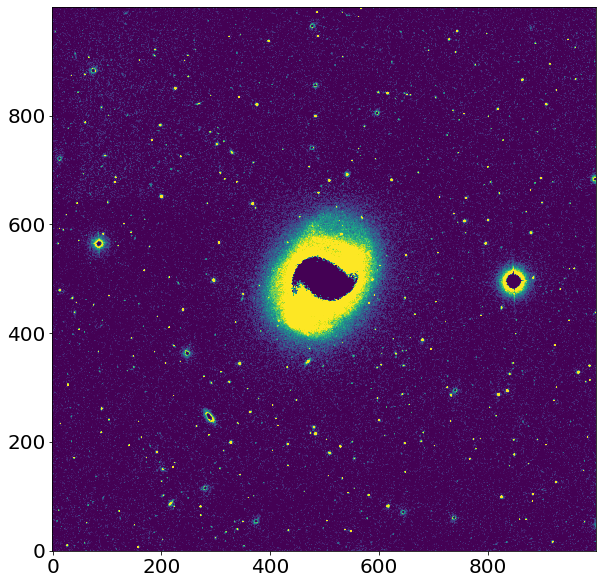

In [19]:
plot_segment_residual(segm, im, vmax=im_mean+im_std*5, vmin=im_mean )

In [20]:
oidx = order_cat(cat, key='segment_flux')
source = cat[oidx][0]
source.maxval_xindex = 500
source.maxval_yindex = 500

len(r_list) = 300
8


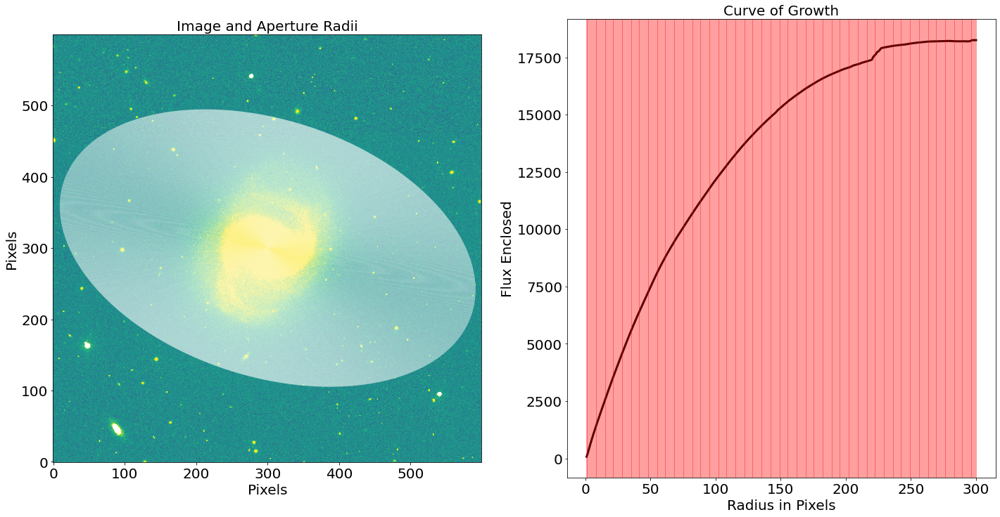

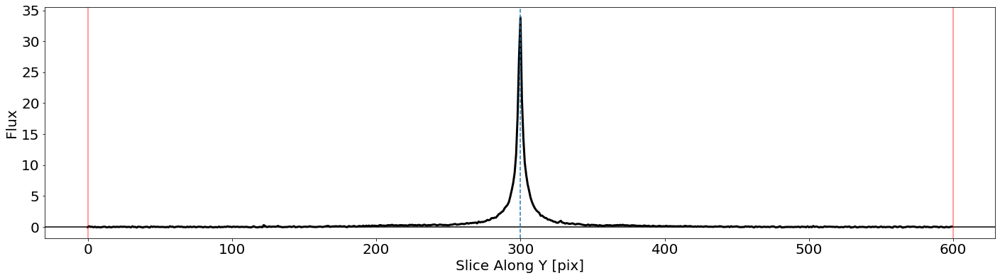

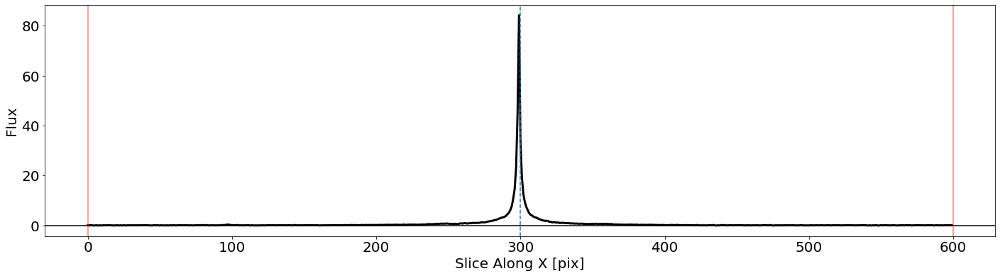

In [21]:
from petrofit.photometry import make_radius_list
from petrofit.photometry import source_photometry

max_pix = 600//2

r_list = make_radius_list(
    max_pix=max_pix, # Max pixel to go up to
    n=max_pix # the number of radii to produce 
)

print("len(r_list) = {}".format(len(r_list)))


# Photomerty 
flux_arr, area_arr, error_arr = source_photometry(
    
    # Inputs 
    source, # Source (`photutils.segmentation.catalog.SourceCatalog`)
    im, # Image as 2D array 
    segm_deblend, # Deblended segmentation map of image
    r_list, # list of aperture radii  
    
    # Options 
    cutout_size=max(r_list)*2, # Cutout out size, set to double the max radius  
    bkg_sub=True, # Subtract background  
    sigma=1, sigma_type='clip', # Fit a 2D plane to pixels within 1 sigma of the mean
    plot=True, vmax=vmax, vmin=vmin, # Show plot with max and min defined above
)
plt.show()

In [22]:
from petrofit.petrosian import Petrosian, PetrosianCorrection
p = Petrosian(r_list, area_arr, flux_arr)

corrected_p = p

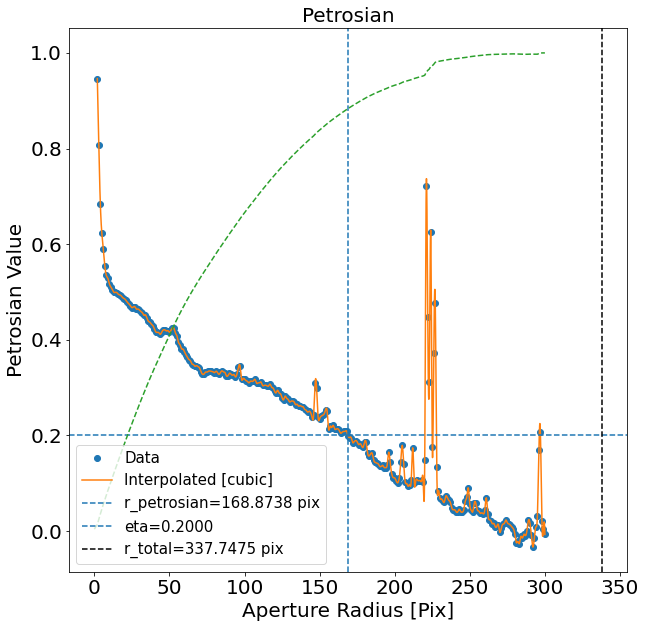

In [23]:
p.plot(1,1)

In [24]:
from petrofit.segmentation import get_source_position
image_x_0, image_y_0 = get_source_position(source)

from petrofit.segmentation import get_source_ellip
ellip = get_source_ellip(source)

from petrofit.segmentation import get_source_elong
elong = get_source_elong(source)

from petrofit.segmentation import get_source_theta
theta = get_source_theta(source)

print(theta)
print(ellip)

-0.31366427613283526
0.4014798948483841


Truncation was applied
total_flux =  18248.633643
max_photometry_r =  300.0


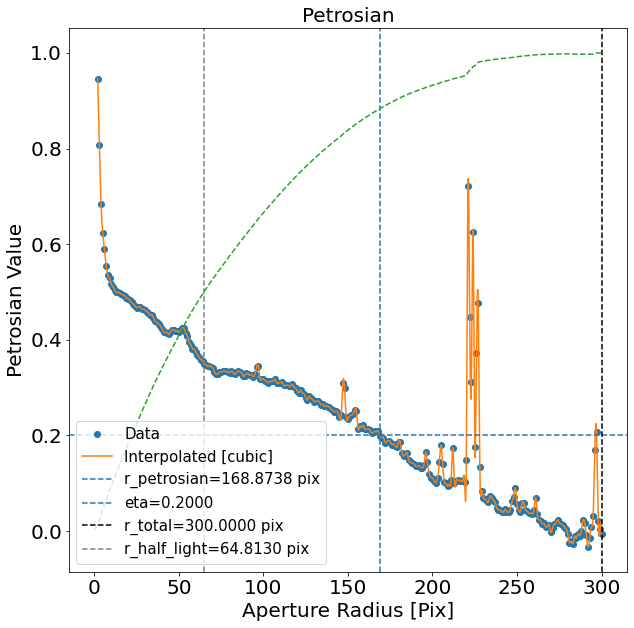

In [25]:
max_photometry_r =  max(corrected_p.r_list)

if corrected_p.total_flux > max_photometry_r or np.isnan(corrected_p.total_flux ):
    print("Truncation was applied")
    truncated_epsilon = max_photometry_r / corrected_p.r_petrosian
    corrected_p.epsilon = truncated_epsilon
else:
    print("Truncation was not needed")

# Print Radii
print('total_flux = ', corrected_p.total_flux)
print('max_photometry_r = ', max_photometry_r)

# Plot Petrosian 
corrected_p.plot(plot_r=True, plot_normalized_flux=True)
plt.show()

In [26]:
corrected_p.total_flux

18248.633643

In [27]:
pc = PetrosianCorrection("example_correction_gid_no_psf.yaml")

In [28]:
n = pc.estimate_n(
    p.r_half_light,
    p.concentration_index()[-1]
)

print(n)

if np.isnan(n):
    n = 4
    print("fixed n:",n)

2.5857073206492145


In [29]:
r_eff = corrected_p.r_half_light

print(r_eff)

64.8129625925185


In [30]:
from photutils.isophote import EllipseGeometry, Ellipse

# Define EllipseGeometry using ellip and theta
g = EllipseGeometry(image_x_0, image_y_0, 1., ellip, theta)

# Create Ellipse model 
ellipse = Ellipse(im, geometry=g)

# Fit isophote at r_eff
iso = ellipse.fit_isophote(r_eff)

# Get flux at r_eff
amplitude = iso.intens

print(amplitude)

0.389695448948172


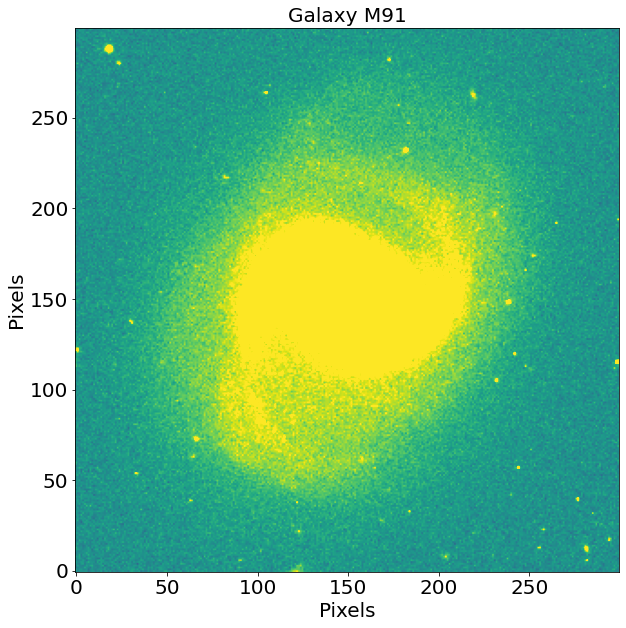

In [31]:
from astropy.nddata import Cutout2D
from petrofit.segmentation import masked_segm_image

# Define cutout size 
cutout_size = 300

# Make an image with all sources masked except `source`
masked_image = masked_segm_image(source, im, segm_deblend, fill=None, mask_background=False)

# Make cutouts 
fitting_image = Cutout2D(masked_image, (image_x_0, image_y_0), cutout_size, mode='partial', copy=True)
fitting_image_unmasked = Cutout2D(im, (image_x_0, image_y_0), cutout_size, mode='partial', copy=True)

#fitting_image = fitting_image_unmasked
#fitting_image.data[np.where(fitting_image.data < data_stats[base_filter][2]*5)] = np.nan

# Define new center 
x_0 = y_0 = cutout_size // 2

# Plot cutout that will be fit 
plt.imshow(fitting_image.data, vmin=vmin, vmax=vmax)
plt.title("Galaxy M91")
plt.xlabel("Pixels")
plt.ylabel("Pixels")
plt.show()

In [32]:
from astropy.modeling import models 
from petrofit.models import CoreSersic2D
from petrofit.fitting import fit_plane
center_slack = 6

sersic_model = models.Sersic2D(
    
        amplitude=amplitude,
        r_eff=r_eff,
        n=n,
        x_0=x_0,
        y_0=y_0,
        ellip=ellip, 
        theta=theta,
    
        bounds = {
            'amplitude': (0., None),
            'r_eff': (0, None),
            'n': (0.5, 10),
            'ellip': (0, 1),
            'theta': (-2*np.pi, 2*np.pi),
            'x_0': (x_0 - center_slack/2, x_0 + center_slack/2),
            'y_0': (y_0 - center_slack/2, y_0 + center_slack/2),
        },
    )  #+ models.Const2D(amplitude=data_stats[base_filter][2]) #+ fit_background(fitting_image.data, sigma=3)[0] #+ models.Const2D(amplitude=0)


sersic_model_core = models.Sersic2D(
    
        amplitude=amplitude*2,
        r_eff=r_eff/2,
        n=n,
        x_0=x_0,
        y_0=y_0,
        ellip=ellip, 
        theta=theta,
    
        bounds = {
            'amplitude': (0., None),
            'r_eff': (0, None),
            'n': (0, 10),
            'ellip': (0, 1),
            'theta': (-2*np.pi, 2*np.pi),
            'x_0': (x_0 - center_slack/2, x_0 + center_slack/2),
            'y_0': (y_0 - center_slack/2, y_0 + center_slack/2),
        },
    )  #+ models.Const2D(amplitude=data_stats[base_filter][2]) #+ fit_background(fitting_image.data, sigma=3)[0] #+ models.Const2D(amplitude=0)


In [33]:
from petrofit.models import PSFModel
from petrofit.fitting import fit_model, model_to_image

psf_sersic_model = PSFModel.wrap(sersic_model, 
                                 #psf= psf,
                                 #oversample=('x_0', 'y_0', 15, 20),
                                 oversample=None
                                )

psf_sersic_core_model = PSFModel.wrap(sersic_model, 
                                 #psf= psf,
                                 oversample=5#('x_0', 'y_0', 20, 20),
                                )


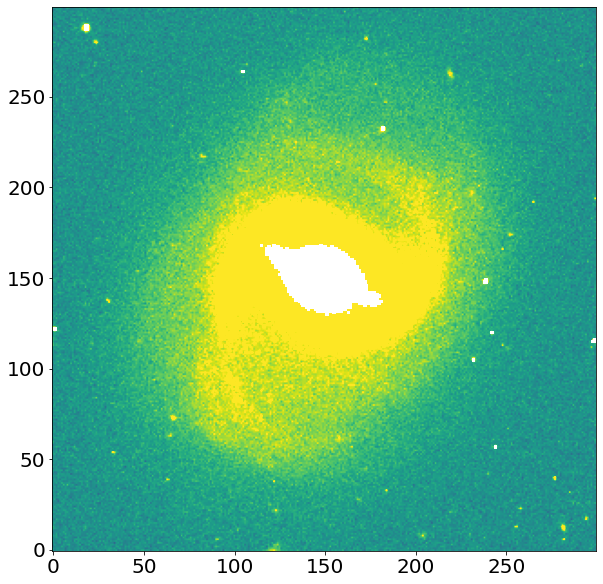

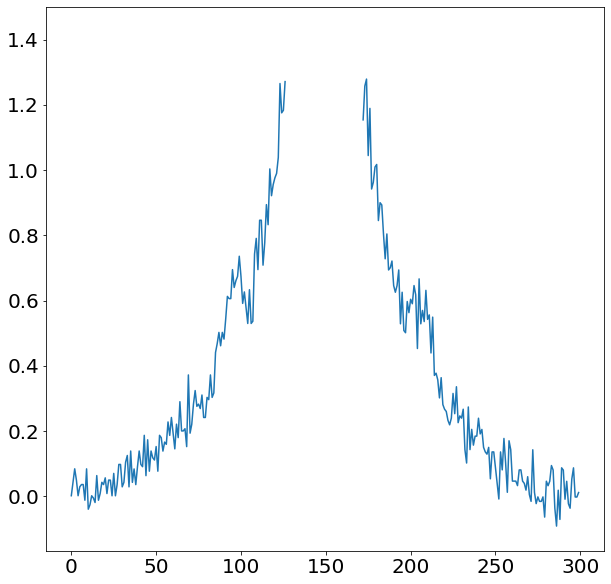

CPU times: user 731 ms, sys: 9.88 ms, total: 740 ms
Wall time: 733 ms


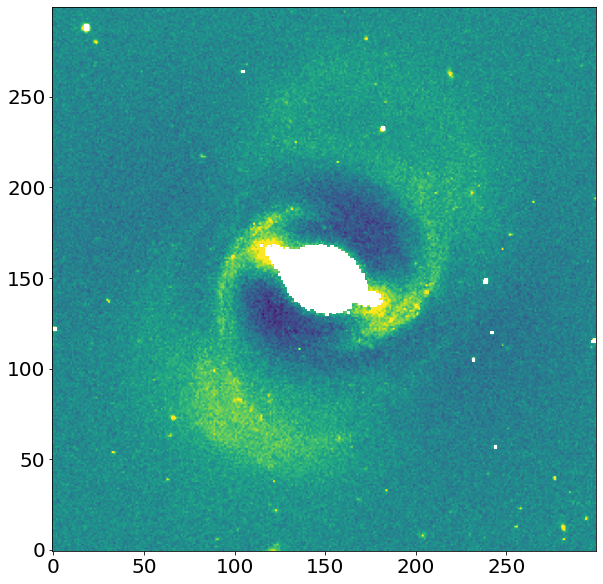

In [34]:
%%time

sigma_masked_fitting_image = fitting_image.data.copy()
#sigma_masked_fitting_image[np.where(sigma_masked_fitting_image > np.nanstd(sigma_masked_fitting_image)*0.25)] = np.nan
# sigma_masked_fitting_image[np.where(sigma_masked_fitting_image > np.nanstd(sigma_masked_fitting_image)*0.75)] = np.nan
sigma_masked_fitting_image[np.where(sigma_masked_fitting_image > np.nanstd(sigma_masked_fitting_image)*2)] = np.nan
plt.imshow(sigma_masked_fitting_image, vmax=vmax, vmin=vmin)

plt.show()

plt.plot(sigma_masked_fitting_image[int(x_0),:])

plt.show()

# from petrofit.fitting import fit_model

fitted_model_wings, fit_info = fit_model(
    sigma_masked_fitting_image,  psf_sersic_model,
    maxiter=10000,
    epsilon=1.4901161193847656e-08,
    acc=1e-09,
)

# Set the size of the model image equal to the fitted image
fitted_image_size = sigma_masked_fitting_image.data.shape[0]

# Center the model image at the center of the fitted image
# so the two images cover the same window 
fitted_image_center = fitted_image_size // 2 

# Generate a model image from the model
fitted_wing_image = model_to_image(
    x=fitted_image_center, 
    y=fitted_image_center, 
    size=fitted_image_size,
    model=fitted_model_wings
)

plt.imshow(sigma_masked_fitting_image-fitted_wing_image, vmax=vmax, vmin=vmin)



In [35]:
def make_grid(size, factor=1):
    assert isinstance(factor, int)
    x_arange = y_arange = (np.arange(0.5, size * factor, 1) / factor) - 0.5
    return np.meshgrid(x_arange, y_arange)

def make_ellip_mask(size, x_0, y_0, r, ellip=0., theta=0):
    x , y = make_grid(size)
    
    a, b = 1, (1 - ellip)
    cos_theta, sin_theta = np.cos(theta), np.sin(theta)
    x_maj = (x - x_0) * cos_theta + (y - y_0) * sin_theta
    x_min = -(x - x_0) * sin_theta + (y - y_0) * cos_theta
    z = np.sqrt((x_maj / a) ** 2 + (x_min / b) ** 2)
    return  z < r

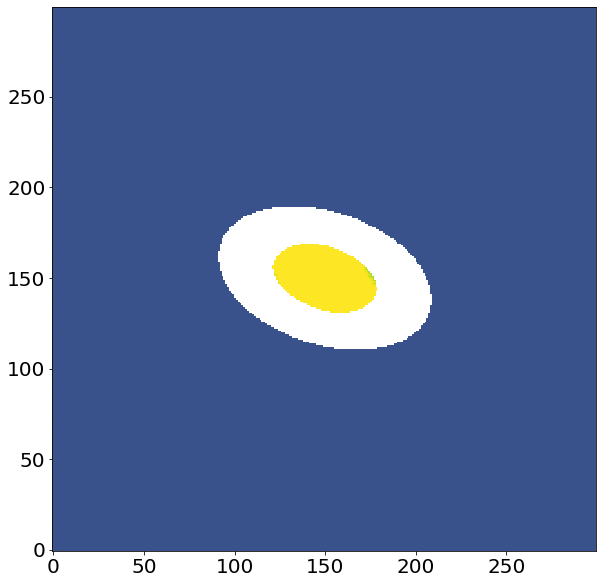

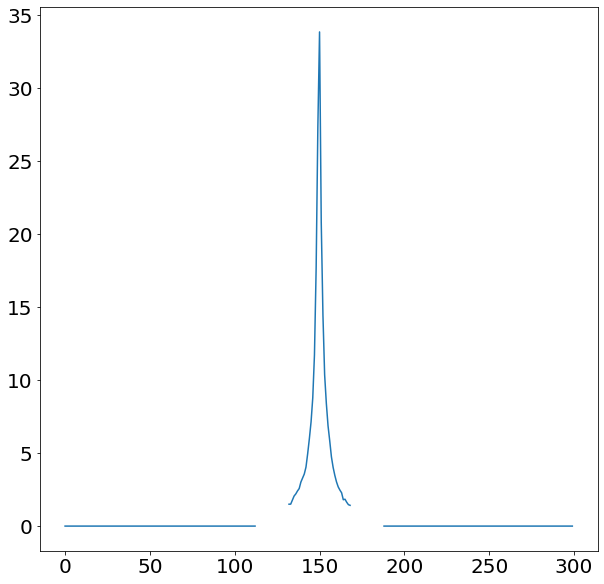

CPU times: user 17.9 s, sys: 1.61 s, total: 19.5 s
Wall time: 19.5 s


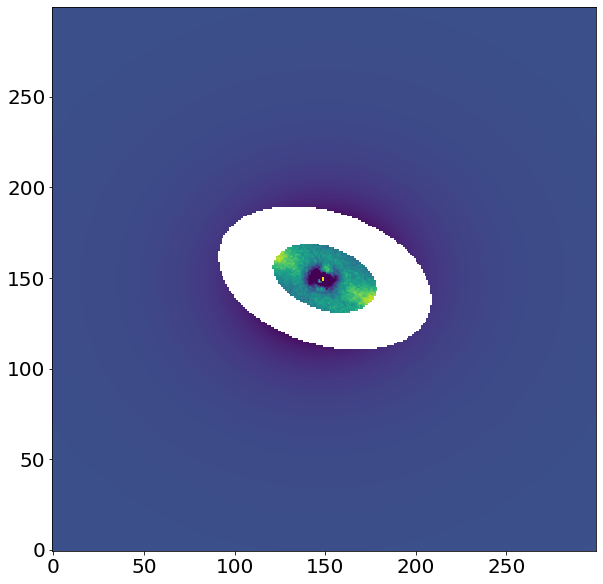

In [36]:
%%time

sigma_masked_fitting_image = fitting_image.data.copy()
sigma_masked_fitting_image[np.where(sigma_masked_fitting_image < np.nanstd(sigma_masked_fitting_image)*0.5)] =  np.nan

ellp_mask = make_ellip_mask(sigma_masked_fitting_image.shape[0], x_0, y_0, 30, ellip=ellip, theta=theta)
sigma_masked_fitting_image[~ellp_mask] = np.nan

ellp_mask = make_ellip_mask(sigma_masked_fitting_image.shape[0], x_0, y_0, 60, ellip=ellip, theta=theta)
sigma_masked_fitting_image[~ellp_mask] =0

plt.imshow(sigma_masked_fitting_image, vmax=vmax*3, vmin=vmin)

plt.show()

plt.plot(sigma_masked_fitting_image[:, int(x_0)])

plt.show()

from petrofit.fitting import fit_model

fitted_model_core, fit_info = fit_model(
    sigma_masked_fitting_image, psf_sersic_core_model,
    maxiter=10000,
    epsilon=1.4901161193847656e-08,
    acc=1e-09,
)


# Generate a model image from the model
fitted_core_image = model_to_image(
    x=fitted_image_center, 
    y=fitted_image_center, 
    size=fitted_image_size,
    model= fitted_model_core
)

plt.imshow(sigma_masked_fitting_image-fitted_core_image, vmax=vmax*3, vmin=vmin)

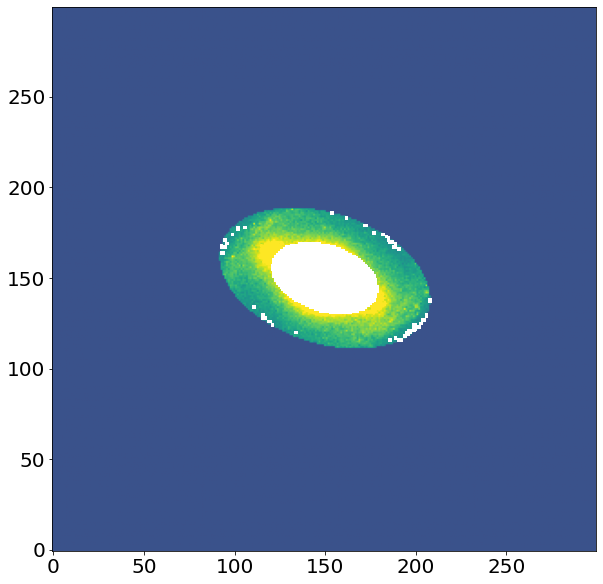

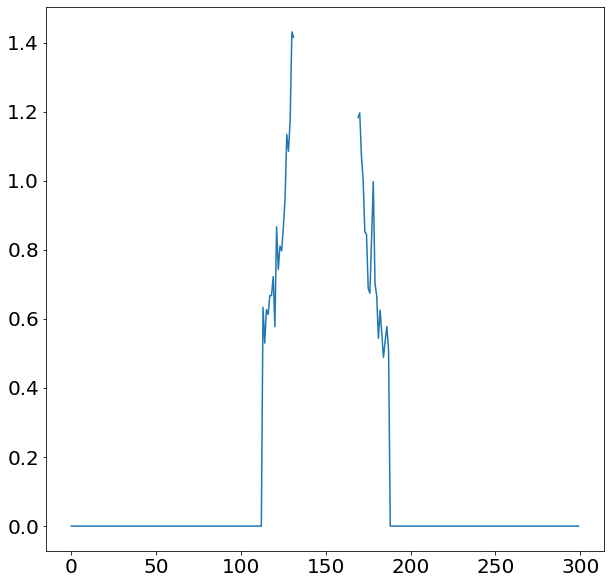

/home/robel/miniconda3/envs/petrofit/lib/python3.7/site-packages/astropy/modeling/functional_models.py:2576: RuntimeWarning: divide by zero encountered in true_divide
  z = np.sqrt((x_maj / a) ** 2 + (x_min / b) ** 2)


CPU times: user 7.87 s, sys: 620 ms, total: 8.49 s
Wall time: 8.52 s


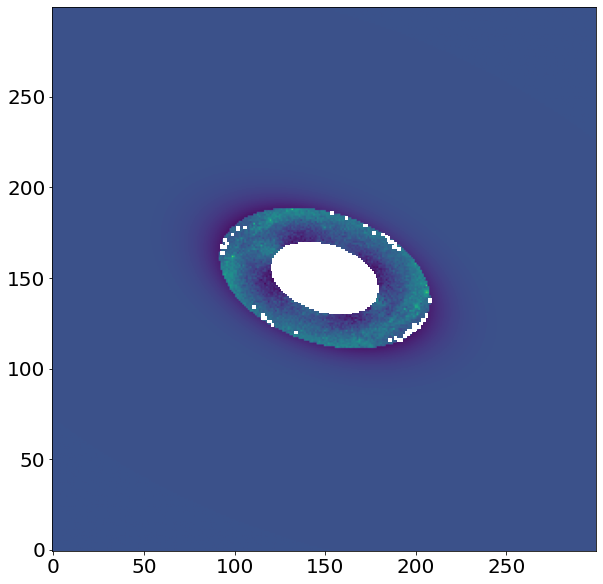

In [37]:
%%time

sigma_masked_fitting_image = fitting_image.data.copy()
sigma_masked_fitting_image[np.where(sigma_masked_fitting_image < np.nanstd(sigma_masked_fitting_image)*0.5)] =  np.nan

ellp_mask = make_ellip_mask(sigma_masked_fitting_image.shape[0], x_0, y_0, 30, ellip=ellip, theta=theta)
sigma_masked_fitting_image[ellp_mask] = np.nan

ellp_mask = make_ellip_mask(sigma_masked_fitting_image.shape[0], x_0, y_0, 60, ellip=ellip, theta=theta)
sigma_masked_fitting_image[~ellp_mask] =0

plt.imshow(sigma_masked_fitting_image, vmax=vmax*3, vmin=vmin)

plt.show()

plt.plot(sigma_masked_fitting_image[:, int(x_0)])

plt.show()

from petrofit.fitting import fit_model

fitted_model_core_2, fit_info = fit_model(
    sigma_masked_fitting_image, psf_sersic_core_model,
    maxiter=10000,
    epsilon=1.4901161193847656e-08,
    acc=1e-09,
)


# Generate a model image from the model
fitted_core_2_image = model_to_image(
    x=fitted_image_center, 
    y=fitted_image_center, 
    size=fitted_image_size,
    model= fitted_model_core_2
)

plt.imshow(sigma_masked_fitting_image-fitted_core_2_image, vmax=vmax*3, vmin=vmin)

In [38]:
# %%time

# sigma_masked_fitting_image = fitting_image.data.copy()
# #sigma_masked_fitting_image[np.where(sigma_masked_fitting_image > np.nanstd(sigma_masked_fitting_image)*0.5)] = np.nan
# sigma_masked_fitting_image[np.where(
#     (sigma_masked_fitting_image < np.nanstd(sigma_masked_fitting_image)*1).astype(int) |  (sigma_masked_fitting_image > np.nanstd(sigma_masked_fitting_image)*4).astype(int)
# )] = np.nan

# plt.imshow(sigma_masked_fitting_image, vmax=vmax, vmin=vmin)

# plt.show()

# plt.plot(sigma_masked_fitting_image[:, int(x_0)])

# plt.show()

# from petrofit.fitting import fit_model
# # psf_sersic_model_low_n = deepcopy(psf_sersic_model)
# # psf_sersic_model_low_n.n = 1
# # psf_sersic_model_low_n.amplitude *= 0.1
# # psf_sersic_model_low_n.bounds.update({'x_0': (None, None), 'y_0': (None, None)})

# fitted_model_wings_low_n , fit_info = fit_model(
#     sigma_masked_fitting_image,  psf_sersic_model,
#     maxiter=10000,
#     epsilon=1.4901161193847656e-08,
#     acc=1e-09,
# )

In [39]:
wing_mod = fitted_model_wings.model
# for param in wing_mod.param_names:
#     wing_mod.fixed[param] = True
    

In [40]:
%%time

from petrofit.fitting import fit_model

combined_psf_model = psf_sersic_model

combined_psf_model = PSFModel.wrap(
    #sersic_model,
    #psf_sersic_model.model,
    #fitted_model_core.model+fitted_model_wings.model,
    fitted_model_core.model+fitted_model_core_2.model+wing_mod, 
    #fitted_model_core.model+fitted_model_wings_low_n.model+fitted_model_wings_low_n.model+fitted_model_wings.model, 
    #combined_psf_model_1.model + sersic_model,
    #psf=psf,
    #psf=psf_set[base_filter],
    #psf=block_reduce(psf_set[base_filter], 4)/4**2, 
    oversample=5,
    #oversample=('x_0_0', 'y_0_0', 90, 10),

) 
# # Limit PSF rotation to -5 to 5 degrees
combined_psf_model.bounds['psf_pa'] = (-1, 1)

# # To disable the PSF rotation, 
# # you can set the psf_pa to fixed.
# combined_psf_model.fixed['psf_pa'] = True

fitted_model, fit_info = fit_model(
    fitting_image.data, combined_psf_model,
    maxiter=1000000,
    epsilon=1.4901161193847656e-08,
    acc=1e-20,
)


CPU times: user 2min 5s, sys: 5.48 s, total: 2min 11s
Wall time: 2min 11s


In [41]:
#fitted_model =  fitted_model_core_2.model

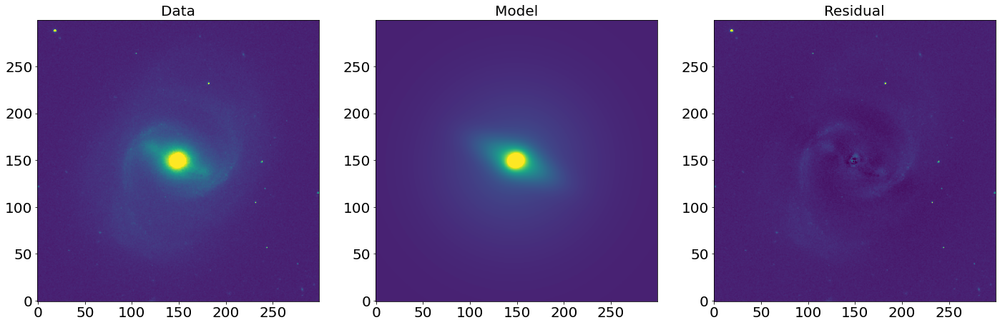

In [42]:
from petrofit.fitting import model_to_image

# Make Model Image 
# ----------------

# Set the size of the model image equal to the fitted image
fitted_image_size = fitting_image.data.shape[0]

# Center the model image at the center of the fitted image
# so the two images cover the same window 
fitted_image_center = fitted_image_size // 2 

# Generate a model image from the model
fitted_model_image = model_to_image(
    x=fitted_image_center, 
    y=fitted_image_center, 
    size=fitted_image_size,
    model=fitted_model
)

# Plot Model Image
# ----------------

fig, ax = plt.subplots(1, 3, figsize=[24, 12])

vmax_factor = 10
ax[0].imshow(fitting_image_unmasked.data, vmin=vmin, vmax=vmax*vmax_factor)
ax[0].set_title("Data")

ax[1].imshow(fitted_model_image, vmin=vmin, vmax=vmax*vmax_factor)
ax[1].set_title("Model")

diff = fitting_image_unmasked.data - fitted_model_image
ax[2].imshow(diff, vmin=vmin, vmax=vmax*vmax_factor)
ax[2].set_title("Residual")

plt.show()

In [43]:
ori_fitted_model = deepcopy(fitted_model)

In [44]:
from copy import deepcopy

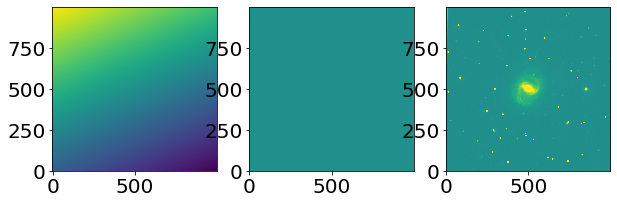

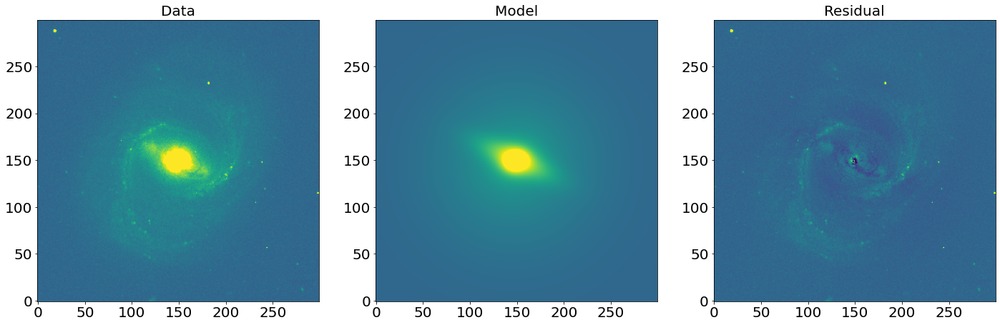

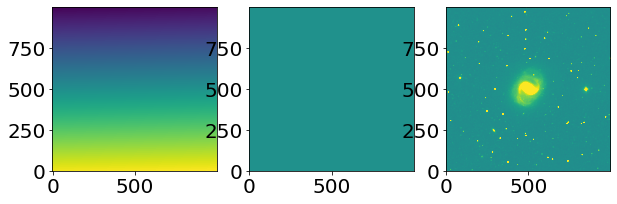

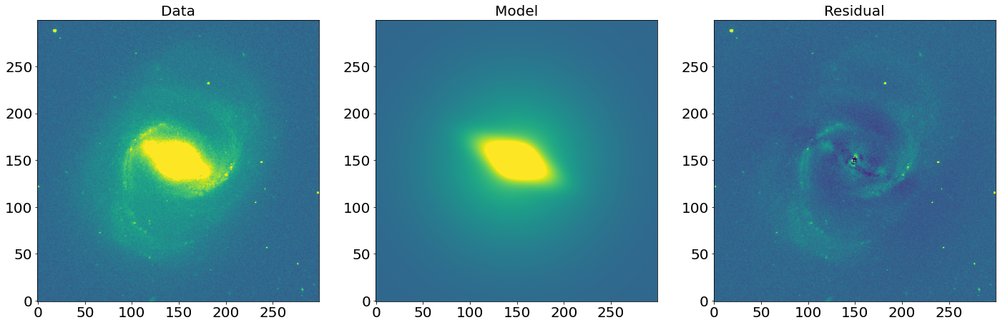

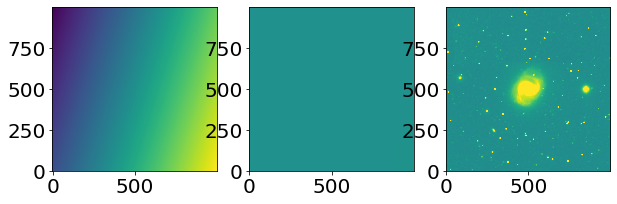

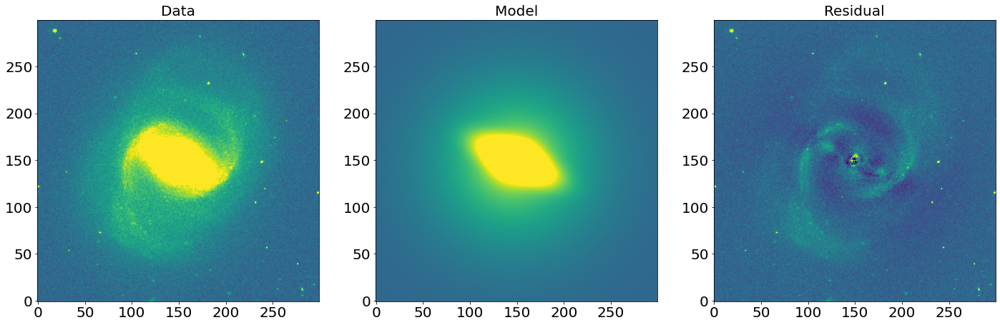

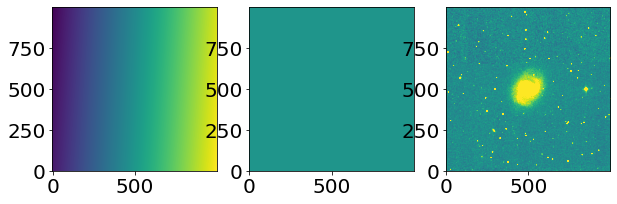

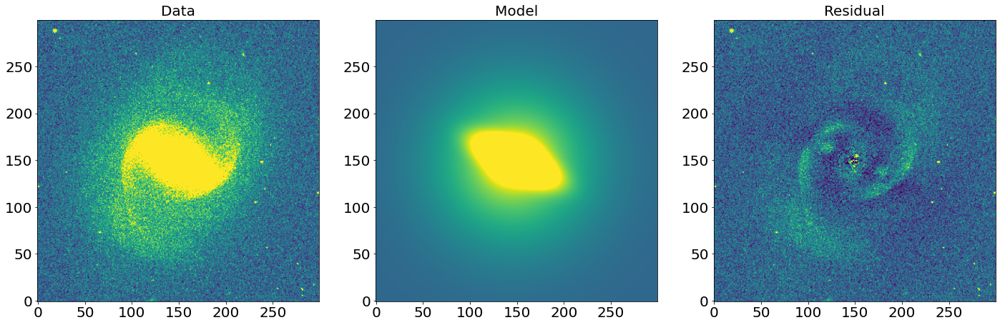

In [46]:
fitted_models = {}
fitted_model_images = {}
target_images = {}

for filter_name in filter_list[:]:
    im = images[filter_name].copy()
    psf = psf_set[filter_name]
    
    im_mean, _, im_std = sigma_clipped_stats(im, sigma=3)

    target_cutout_size = len(im.data)
    bg = calc_bg(im)
    im = im - bg 
    
    # Make an image with all sources masked except `source`
    masked_image = masked_segm_image(source, im, segm_deblend, fill=None, mask_background=False)

    # Make cutouts 
    fitting_image = Cutout2D(masked_image, (image_x_0, image_y_0), cutout_size, mode='partial', copy=True)
    fitting_image_unmasked = Cutout2D(im, (image_x_0, image_y_0), cutout_size, mode='partial', copy=True)
    plt.show()
    
    combined_psf_model = deepcopy(ori_fitted_model)
    
    
    fitted_model, fit_info = fit_model(
        fitting_image.data, combined_psf_model,
        maxiter=1000000,
        epsilon=1.4901161193847656e-08,
        acc=1e-20,
    )
    plt.show()
    
    # Make Model Image 
    # ----------------

    # Set the size of the model image equal to the fitted image
    fitted_image_size = fitting_image.data.shape[0]

    # Center the model image at the center of the fitted image
    # so the two images cover the same window 
    fitted_image_center = fitted_image_size // 2 

    # Generate a model image from the model
    fitted_model_image = model_to_image(
        x=fitted_image_center, 
        y=fitted_image_center, 
        size=fitted_image_size,
        model=fitted_model
    )

    # Plot Model Image
    # ----------------

    fig, ax = plt.subplots(1, 3, figsize=[24, 12])

    vmax_factor = 2
    ax[0].imshow(fitting_image_unmasked.data, vmin=vmin, vmax=vmax*vmax_factor)
    ax[0].set_title("Data")

    ax[1].imshow(fitted_model_image, vmin=vmin, vmax=vmax*vmax_factor)
    ax[1].set_title("Model")

    diff = fitting_image_unmasked.data - fitted_model_image
    ax[2].imshow(diff, vmin=vmin, vmax=vmax*vmax_factor)
    ax[2].set_title("Residual")

    fitted_models[filter_name] = fitted_model
    fitted_model_images[filter_name] = fitted_model_image
    target_images[filter_name] = fitting_image_unmasked
    
    

In [47]:
list(reversed(filter_list)), filter_list

(['SDSSz', 'SDSSi', 'SDSSr', 'SDSSg'], ['SDSSg', 'SDSSr', 'SDSSi', 'SDSSz'])

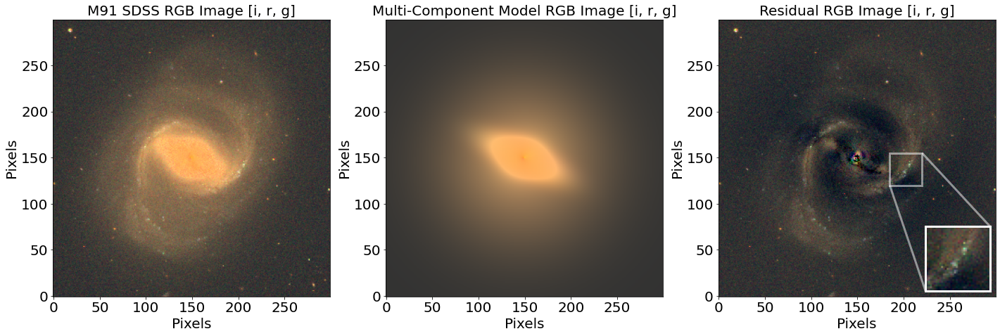

In [48]:
from astropy.visualization import make_lupton_rgb


rgb_filter = ['SDSSz', 'SDSSi', 'SDSSr']
rgb_filter = [ 'SDSSi', 'SDSSr', 'SDSSg']

#fig, ax = plt.subplots(1,3, figsize=[10*3,8])
fig, ax = plt.subplots(1,3, figsize=[8*3,8])

# stretch=0.75
# minimum=-im_std
# Q=4

stretch=0.9
minimum=-im_std
Q=2

plt.sca(ax[0])

plt.imshow(make_lupton_rgb(target_images[rgb_filter[0]].data, 
                           target_images[rgb_filter[1]].data,
                           target_images[rgb_filter[2]].data,
                            stretch=stretch,
                            minimum=minimum,
                            Q=Q,
                          ),
          )

plt.title("M91 SDSS RGB Image [{}, {}, {}]".format(*[i.replace('SDSS', '') for i in rgb_filter]))
plt.xlabel("Pixels")
plt.ylabel("Pixels")

plt.sca(ax[1])
plt.imshow(make_lupton_rgb(fitted_model_images[rgb_filter[0]], 
                           fitted_model_images[rgb_filter[1]],
                           fitted_model_images[rgb_filter[2]],
                           stretch=stretch,
                           minimum=minimum,
                            Q=Q,
                          ), vmax=vmax/3, vmin=vmin 
          )
plt.title("Multi-Component Model RGB Image [{}, {}, {}]".format(*[i.replace('SDSS', '') for i in rgb_filter]))
plt.xlabel("Pixels")
plt.ylabel("Pixels")

plt.sca(ax[2])



# total_image = np.array([i.data for i in target_images.values()])
# total_model = np.array([i.data for i in fitted_model_images.values()])

# plt.imshow((total_image.sum(axis=0) - total_model.sum(axis=0))/7, vmax=vmax, vmin=vmin)

milt_f =1
plt.imshow(make_lupton_rgb(
    (target_images[rgb_filter[0]].data -  fitted_model_images[rgb_filter[0]]*milt_f), 
    (target_images[rgb_filter[1]].data -  fitted_model_images[rgb_filter[1]]*milt_f), 
    (target_images[rgb_filter[2]].data -  fitted_model_images[rgb_filter[2]]*milt_f),
    stretch=stretch,
    minimum=minimum,
    Q=Q,
    ), 
)
plt.title("Residual RGB Image [{}, {}, {}]".format(*[i.replace('SDSS', '') for i in rgb_filter]))
plt.xlabel("Pixels")
plt.ylabel("Pixels")

import numpy as np
import matplotlib.pyplot as plt

from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes,mark_inset


axins = zoomed_inset_axes(ax[2],2,loc='lower right')
axins.imshow(make_lupton_rgb(
    (target_images[rgb_filter[0]].data -  fitted_model_images[rgb_filter[0]]*milt_f), 
    (target_images[rgb_filter[1]].data -  fitted_model_images[rgb_filter[1]]*milt_f), 
    (target_images[rgb_filter[2]].data -  fitted_model_images[rgb_filter[2]]*milt_f),
    stretch=stretch,
    minimum=minimum,
    Q=Q,
    ), 
)

axins.set_xticks([])
x1,x2,y1,y2 = 185, 220, 120,155
axins.set_xlim(x1,x2)
axins.set_ylim(y1,y2)

axins_color = 'white'
axins_lw = 3
axins_alpha = 0.5

mark_inset(ax[2],axins,loc1=1,loc2=3,ec=axins_color,lw=axins_lw, alpha=axins_alpha)
#axins.axis('off')

axins.spines['bottom'].set_color(axins_color)
axins.spines['bottom'].set_linewidth(axins_lw)
axins.spines['top'].set_color(axins_color) 
axins.spines['top'].set_linewidth(axins_lw)
axins.spines['right'].set_color(axins_color)
axins.spines['right'].set_linewidth(axins_lw)
axins.spines['left'].set_color(axins_color)
axins.spines['left'].set_linewidth(axins_lw)

axins.axes.xaxis.set_visible(False)
axins.axes.yaxis.set_visible(False)

savefig('single_multi_comp_galaxy.png')
plt.show()

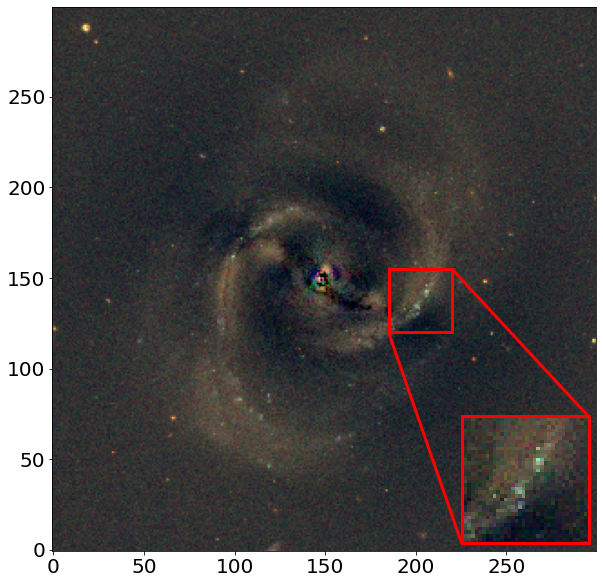

In [49]:

fig = plt.figure()
ax = plt.gca()
ax.imshow(make_lupton_rgb(
    (target_images[rgb_filter[0]].data -  fitted_model_images[rgb_filter[0]]*milt_f), 
    (target_images[rgb_filter[1]].data -  fitted_model_images[rgb_filter[1]]*milt_f), 
    (target_images[rgb_filter[2]].data -  fitted_model_images[rgb_filter[2]]*milt_f),
    stretch=stretch,
    minimum=minimum,
    Q=Q,
    ), 
)

import numpy as np
import matplotlib.pyplot as plt

from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes,mark_inset




axins = zoomed_inset_axes(ax,2,loc='lower right')
axins.imshow(make_lupton_rgb(
    (target_images[rgb_filter[0]].data -  fitted_model_images[rgb_filter[0]]*milt_f), 
    (target_images[rgb_filter[1]].data -  fitted_model_images[rgb_filter[1]]*milt_f), 
    (target_images[rgb_filter[2]].data -  fitted_model_images[rgb_filter[2]]*milt_f),
    stretch=stretch,
    minimum=minimum,
    Q=Q,
    ), 
)

axins.set_xticks([])
x1,x2,y1,y2 = 185, 220, 120,155
axins.set_xlim(x1,x2)
axins.set_ylim(y1,y2)

mark_inset(ax,axins,loc1=1,loc2=3,ec='r',lw=3)
#axins.axis('off')

axins.spines['bottom'].set_color('red')
axins.spines['bottom'].set_linewidth(3)
axins.spines['top'].set_color('red') 
axins.spines['top'].set_linewidth(3)
axins.spines['right'].set_color('red')
axins.spines['right'].set_linewidth(3)
axins.spines['left'].set_color('red')
axins.spines['left'].set_linewidth(3)
axins.axes.xaxis.set_visible(False)
axins.axes.yaxis.set_visible(False)
plt.show()

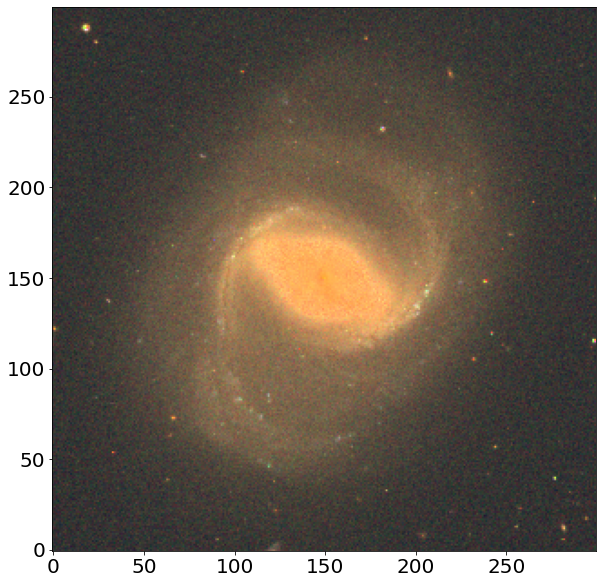

In [50]:

plt.imshow(make_lupton_rgb(target_images[rgb_filter[0]].data, 
                           target_images[rgb_filter[1]].data,
                           target_images[rgb_filter[2]].data,
                                stretch=stretch,
    minimum=minimum,
    Q=Q,
                          ),
          )

In [51]:
from petrofit.fitting import print_model_params

In [52]:
for f in fitted_models:
    print(f)
    print_model_params(fitted_models[f])
    print('\n'*2)

SDSSg
0.1978	amplitude_0
20.4299	r_eff_0
3.7402	n_0
148.7558	x_0_0
149.4645	y_0_0
0.1529	ellip_0
0.4481	theta_0
0.1900	amplitude_1
36.2143	r_eff_1
0.5000	n_1
149.1732	x_0_1
150.7882	y_0_1
0.6825	ellip_1
-0.4205	theta_1
0.0845	amplitude_2
74.2518	r_eff_2
0.5000	n_2
147.0000	x_0_2
147.0000	y_0_2
0.0000	ellip_2
6.2832	theta_2
0.0000	psf_pa



SDSSr
0.4326	amplitude_0
20.0703	r_eff_0
4.1210	n_0
148.9397	x_0_0
149.7212	y_0_0
0.1567	ellip_0
0.4095	theta_0
0.4156	amplitude_1
34.9490	r_eff_1
0.5000	n_1
148.5771	x_0_1
150.2376	y_0_1
0.6583	ellip_1
-0.4431	theta_1
0.1569	amplitude_2
74.8463	r_eff_2
0.5000	n_2
147.0000	x_0_2
147.0000	y_0_2
0.0000	ellip_2
-6.2832	theta_2
0.0000	psf_pa



SDSSi
0.7521	amplitude_0
17.6888	r_eff_0
4.0505	n_0
148.8152	x_0_0
149.6619	y_0_0
0.1291	ellip_0
0.4050	theta_0
0.6381	amplitude_1
34.2051	r_eff_1
0.5000	n_1
149.3247	x_0_1
149.8736	y_0_1
0.6334	ellip_1
-0.4415	theta_1
0.2307	amplitude_2
73.9673	r_eff_2
0.5000	n_2
147.0000	x_0_2
147.0000	y_0_2
0.0000	ellip_2
-1.69